# Advanced FX carry strategies with valuation adjustment

This notebook illustrates of the points discussed in the post “Advanced FX carry strategies with valuation adjustment” available on the Macrosynergy website.

FX forward-implied carry is a popular ingredient in currency trading strategies because it is related to risk premia and implicit policy subsidies. Its signal value can often be increased by considering inflation differentials, hedging costs, data outliers, and market restrictions. However, even then, FX carry is a very imprecise guide for performance, and previous research has shown the benefits of enhancements based on economic performance [(view post here)](https://research.macrosynergy.com/modified-and-balanced-fx-carry/). This post analyses the adjustment of real carry measures by currency over- or undervaluation. As a reference point, it uses point-in-time metrics of purchasing power parity-based valuation estimates that are partly or fully adjusted for historical gaps. The adjustment is conceptually compelling and has historically increased the value of carry signals across a variety of FX carry strategies.

This notebook provides the essential code required to replicate the analysis discussed in the post.

The notebook covers the three main parts:

- Get Packages and JPMaQS Data: This section is responsible for installing and importing the necessary Python packages used throughout the analysis.

- Transformations and Checks: In this part, the notebook performs calculations and transformations on the data to derive the relevant signals and targets used for the analysis, including rolling median calculation, relative values, or building simple linear composite indicators.

- Value Checks: This is the most critical section, where the notebook calculates and implements the trading strategies based on the hypotheses tested in the post. This section involves backtesting simple trading strategies. In particular, the post investigates the use of directional (relative) adjusted real carry for outright (relative) FX forward returns trading. The last part looks at the example of use of hedged carry.

It is important to note that while the notebook covers a selection of indicators and strategies used for the post’s main findings, users can explore countless other possible indicators and approaches. Users can modify the code to test different hypotheses and strategies based on their research and ideas. Best of luck with your research!

## Get packages and JPMaQS data

In [1]:
# Run only if needed!
"""
%%capture
! pip install macrosynergy --upgrade"""

'\n%%capture\n! pip install macrosynergy --upgrade'

In [67]:
import numpy as np
import pandas as pd
from pandas import Timestamp
import matplotlib.pyplot as plt
import seaborn as sns

import os
from IPython.display import display, Markdown

import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.signal as mss
import macrosynergy.pnl as msn
import macrosynergy.visuals as msv

from macrosynergy.download import JPMaQSDownload

import warnings

warnings.simplefilter("ignore")

This notebook downloads selected indicators for the following cross-sections: AUD (Australian dollar), BRL (Brazilian real), CAD (Canadian dollar), CHF (Swiss franc), CLP (Chilean peso), COP (Colombian peso), CZK (Czech Republic koruna), EUR (euro), GBP (British pound), HUF (Hungarian forint), IDR (Indonesian rupiah), ILS (Israeli shekel), INR (Indian rupee), JPY (Japanese yen), KRW (Korean won), MXN (Mexican peso), MYR (Malaysian ringgit), NOK (Norwegian krone), NZD (New Zealand dollar), PEN (Peruvian sol), PHP(Philippine peso), PLN (Polish zloty), RON (Romanian leu), RUB (Russian ruble), SGD(Singapore dollar), SEK (Swedish krona), THB(Thai baht), TRY (Turkish lira), TWD (Taiwanese dollar), USD (U.S. dollar), ZAR (South African rand). For convenience purposes, the cross-sections are collected in a few lists, such as Developed markets currencies, emerging markets, regional cross-sections etc. 

In [3]:
# General cross-sections lists

cids_g3 = ["EUR", "JPY", "USD"]  # DM large currency areas
cids_dmsc = ["AUD", "CAD", "CHF", "GBP", "NOK", "NZD", "SEK"]  # DM small currency areas
cids_latm = ["BRL", "COP", "CLP", "MXN", "PEN"]  # Latam
cids_emea = ["CZK", "HUF", "ILS", "PLN", "RON", "RUB", "TRY", "ZAR"]  # EMEA
cids_emas = ["IDR", "INR", "KRW", "MYR", "PHP", "SGD", "THB", "TWD"]  # EM Asia ex China

cids_dm = cids_g3 + cids_dmsc
cids_em = cids_latm + cids_emea + cids_emas
cids = cids_dm + cids_em

# FX cross-sections lists

cids_nofx = ["EUR", "USD", "JPY", "SGD", "RUB", "TWD"]  # not small or suitable for this analysis
cids_fx = list(set(cids) - set(cids_nofx))

cids_dmfx = list(set(cids_dm).intersection(cids_fx))
cids_emfx = list(set(cids_em).intersection(cids_fx))

cids_eur = ["CHF", "CZK", "HUF", "NOK", "PLN", "RON", "SEK"]  # trading against EUR
cids_eud = ["GBP", "TRY"]  # trading against EUR and USD
cids_usd = list(set(cids_fx) - set(cids_eur + cids_eud))  # trading against USD

The description of each JPMaQS category is available under [Macro quantamental academy](https://academy.macrosynergy.com/quantamental-indicators/), or [JPMorgan Markets](https://markets.jpmorgan.com/#jpmaqs) (password protected). For tickers used in this notebook, see [FX forward carry](https://academy.macrosynergy.com/academy/Themes/Stylized%20trading%20factors/_build/html/notebooks/FX%20forward%20carry.php), [FX tradeability and flexibility](https://academy.macrosynergy.com/academy/Themes/Stylized%20trading%20factors/_build/html/notebooks/FX%20tradeability%20and%20flexibility.php), and [FX forward returns](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/FX%20forward%20returns.php)

In [4]:
# Categories

fxcr = [
    "FXCRY_NSA",
    "FXCRY_VT10",
    "FXCRR_NSA",
    "FXCRR_VT10",
    "FXCRRHvGDRB_NSA",
]
povs = [
    "PPPFXOVERVALUE_NSA"
]

main = fxcr + povs

rets = [
    "FXTARGETED_NSA",
    "FXUNTRADABLE_NSA",
    "FXXR_NSA",
    "FXXR_VT10",
    "FXXRHvGDRB_NSA",
]

xcats = main + rets

xtix = ["USD_EQXR_NSA", "GLB_DRBXR_NSA"]

tickers = [cid + "_" + xcat for cid in cids for xcat in xcats] + xtix
print(f"Maximum number of tickers is {len(tickers)}")

Maximum number of tickers is 343


In [5]:
# Download series from J.P. Morgan DataQuery by tickers

start_date = "1990-01-01"

# Retrieve credentials

client_id: str = os.getenv("DQ_CLIENT_ID")
client_secret: str = os.getenv("DQ_CLIENT_SECRET")

# Download from DataQuery

with JPMaQSDownload(client_id=client_id, client_secret=client_secret) as downloader:
    df = downloader.download(
        tickers=tickers,
        start_date=start_date,
        metrics=["value",],
        suppress_warning=True,
        show_progress=True,
    )

Timestamp UTC:  2024-03-21 12:24:27
Connection successful!


Requesting data: 100%|██████████| 18/18 [00:03<00:00,  4.93it/s]


Some expressions are missing from the downloaded data. Check logger output for complete list.
12 out of 343 expressions are missing. To download the catalogue of all available expressions and filter the unavailable expressions, set `get_catalogue=True` in the call to `JPMaQSDownload.download()`.
Some dates are missing from the downloaded data. 
3 out of 8931 dates are missing.


The JPMaQS indicators we consider are downloaded using the J.P. Morgan Dataquery API interface within the `macrosynergy` package. This is done by specifying ticker strings, formed by appending an indicator category code <category> to a currency area code <cross_section>. These constitute the main part of a full quantamental indicator ticker, taking the form `DB(JPMAQS,<cross_section>_<category>,<info>)`, where <info> denotes the time series of information for the given cross-section and category. The following types of information are available:

`value` giving the latest available values for the indicator
`eop_lag` referring to days elapsed since the end of the observation period
`mop_lag` referring to the number of days elapsed since the mean observation period
`grade` denoting a grade of the observation, giving a metric of real-time information quality.

After instantiating the `JPMaQSDownload` class within the `macrosynergy.download` module, one can use the `download(tickers,start_date,metrics)` method to easily download the necessary data, where `tickers` is an array of ticker strings, `start_date` is the first collection date to be considered and `metrics` is an array comprising the times series information to be downloaded. For more information see [here](https://github.com/macrosynergy/macrosynergy/blob/develop/README.md)

In [6]:
dfx = df.copy()
dfx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2223199 entries, 0 to 2223198
Data columns (total 4 columns):
 #   Column     Dtype         
---  ------     -----         
 0   real_date  datetime64[ns]
 1   cid        object        
 2   xcat       object        
 3   value      float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 67.8+ MB


### Blacklist dictionary for FX

Before running the analysis, `make_blacklist()` helper function from the `macrosynergy` package, creates a standardized dictionary of blacklist periods, i.e. periods that affect the validity of an indicator, based on standardized panels of binary categories.

Put simply, this function allows converting category variables into blacklist dictionaries that can then be passed to other functions. Below, we picked two indicators for FX tradability and flexibility. `FXTARGETED_NSA` is an exchange rate target dummy, which takes a value of 1 if the exchange rate is targeted through a peg or any regime that significantly reduces exchange rate flexibility and 0 otherwise. `FXUNTRADABLE_NSA` is also a dummy variable that takes the value one if liquidity in the main FX forward market is limited or there is a distortion between tradable offshore and untradable onshore contracts.

In [7]:
dfb = df[df["xcat"].isin(["FXTARGETED_NSA", "FXUNTRADABLE_NSA"])].loc[
    :, ["cid", "xcat", "real_date", "value"]
]
dfba = (
    dfb.groupby(["cid", "real_date"])
    .aggregate(value=pd.NamedAgg(column="value", aggfunc="max"))
    .reset_index()
)
dfba["xcat"] = "FXBLACK"
fxblack = msp.make_blacklist(dfba, "FXBLACK")
fxblack

{'BRL': (Timestamp('2012-12-03 00:00:00'), Timestamp('2013-09-30 00:00:00')),
 'CHF': (Timestamp('2011-10-03 00:00:00'), Timestamp('2015-01-30 00:00:00')),
 'CZK': (Timestamp('2014-01-01 00:00:00'), Timestamp('2017-07-31 00:00:00')),
 'ILS': (Timestamp('1999-01-01 00:00:00'), Timestamp('2005-12-30 00:00:00')),
 'INR': (Timestamp('1999-01-01 00:00:00'), Timestamp('2004-12-31 00:00:00')),
 'MYR_1': (Timestamp('1999-01-01 00:00:00'), Timestamp('2007-11-30 00:00:00')),
 'MYR_2': (Timestamp('2018-07-02 00:00:00'), Timestamp('2024-03-20 00:00:00')),
 'PEN': (Timestamp('2021-07-01 00:00:00'), Timestamp('2021-07-30 00:00:00')),
 'RON': (Timestamp('1999-01-01 00:00:00'), Timestamp('2005-11-30 00:00:00')),
 'RUB_1': (Timestamp('1999-01-01 00:00:00'), Timestamp('2005-11-30 00:00:00')),
 'RUB_2': (Timestamp('2022-02-01 00:00:00'), Timestamp('2024-03-20 00:00:00')),
 'SGD': (Timestamp('1999-01-01 00:00:00'), Timestamp('2024-03-20 00:00:00')),
 'THB': (Timestamp('2007-01-01 00:00:00'), Timestamp('20

### Availability

It is important to assess data availability before conducting any analysis. It allows for the identification of any potential gaps or limitations in the dataset, which can impact the validity and reliability of analysis and ensure that a sufficient number of observations for each selected category and cross-section is available, as well as determining the appropriate time periods for analysis. 

The function [missing_in_df()](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#detect-missing-categories-or-cross-sections-with-missing-in-df) displays (1) categories that are missing across all expected cross-sections for a given category name list, and (2) cross-sections that are missing within a category.

In [8]:
msm.missing_in_df(df, xcats=xcats, cids=cids)

Missing xcats across df:  []
Missing cids for FXCRRHvGDRB_NSA:  ['USD']
Missing cids for FXCRR_NSA:  ['USD']
Missing cids for FXCRR_VT10:  ['USD']
Missing cids for FXCRY_NSA:  ['USD']
Missing cids for FXCRY_VT10:  ['USD']
Missing cids for FXTARGETED_NSA:  ['USD']
Missing cids for FXUNTRADABLE_NSA:  ['USD']
Missing cids for FXXRHvGDRB_NSA:  ['USD']
Missing cids for FXXR_NSA:  ['USD']
Missing cids for FXXR_VT10:  ['USD']
Missing cids for PPPFXOVERVALUE_NSA:  ['TWD', 'USD']


[check_availability()](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#view-available-data-history-with-check-availability) functions list visualizes start years and the number of missing values at or before the end date of all selected cross-sections and across a list of categories. It also displays unavailable indicators as gray fields and color codes for the starting year of each series, with darker colors indicating more recent starting years. 


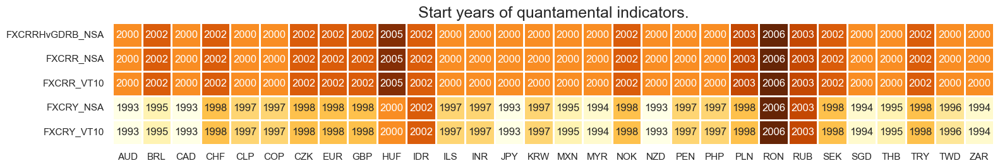

In [9]:
msm.check_availability(df, xcats=fxcr, cids=cids, missing_recent=False)

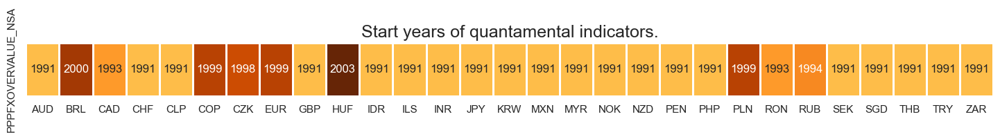

In [10]:
msm.check_availability(df, xcats=povs, cids=cids, missing_recent=False)

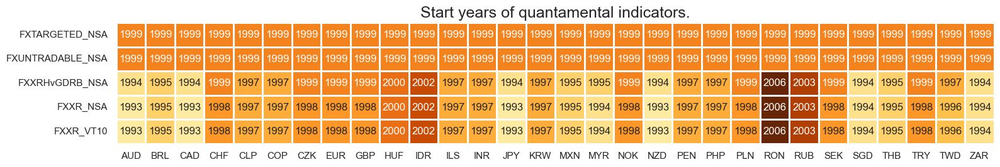

In [11]:
msm.check_availability(df, xcats=rets, cids=cids, missing_recent=False)

## Transformations and checks

### Features

#### FX forward-implied carry

Using rolling medians can be a useful approach to mitigate the undue influence of short-term (untradable) carry distortions in financial data due to various factors, such as temporary market shocks, liquidity issues, or unusual trading activity. These distortions can have a significant impact on individual data points. By calculating the median over a rolling window of observations, we obtain a more robust measure of central tendency that is less affected by extreme values or outliers. We use 5-day rolling medians with postfix `_5DMM`, which aligns with market conventions. This means that for each day, we calculate the median of the previous 5 days' observations. 

In [12]:
calcs = [f"{cr}_5DMM = ( {cr} ).rolling(5).median()" for cr in fxcr]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids_fx, blacklist=fxblack)
dfx = msm.update_df(dfx, dfa)

JPMaQS records carry at the end of the local trading day. Sometimes, these records can be distorted by a single trade or reflect market conditions that compromise the information value of the data or do not allow trading at the recorded price. Therefore, we smooth all daily FX carry series in the form of a 5-day moving median (in the cell above) and contain the absolute value of real carry at 25%, positive or negative with the standard python [`.clip()`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.clip.html) function, where all values below the minimum threshold (-25% in our case) are set to a threshold value; and all values above the threshold (25% in our case) will be set to it.

In [13]:
calcs = [f"{cr}_5DMMW25 = ( {cr}_5DMM ).clip(-25, 25)" for cr in fxcr]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids_fx, blacklist=fxblack)
dfx = msm.update_df(dfx, dfa)

With the help of [`view_ranges()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-distributions-with-view-ranges) and [`view_timelines()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-time-series-with-view-timelines) from the `macrosynergy` package we plot 5-day clipped moving averages of `FXCRR_NSA_5DMMW25` (Real carry), and `FXCRRHvGDRB_NSA_5DMMW25` (Real carry minus hedging cost). 

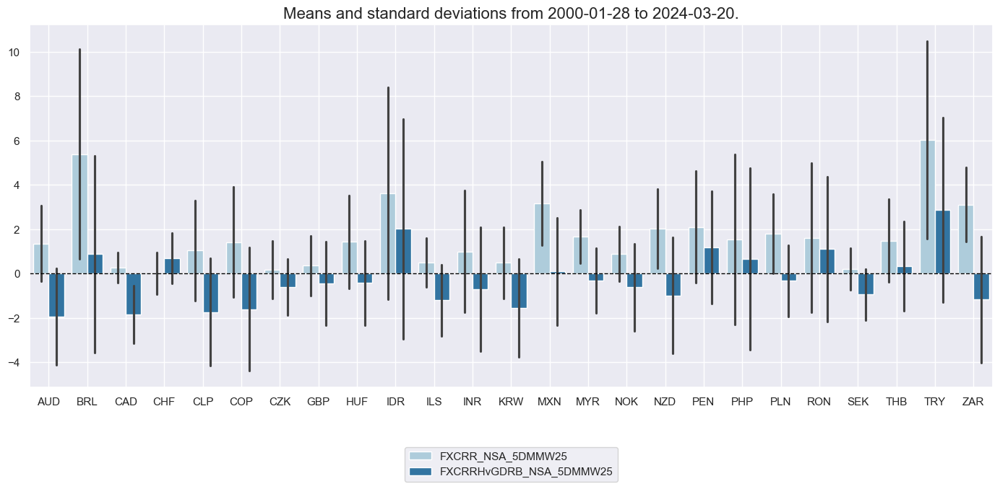

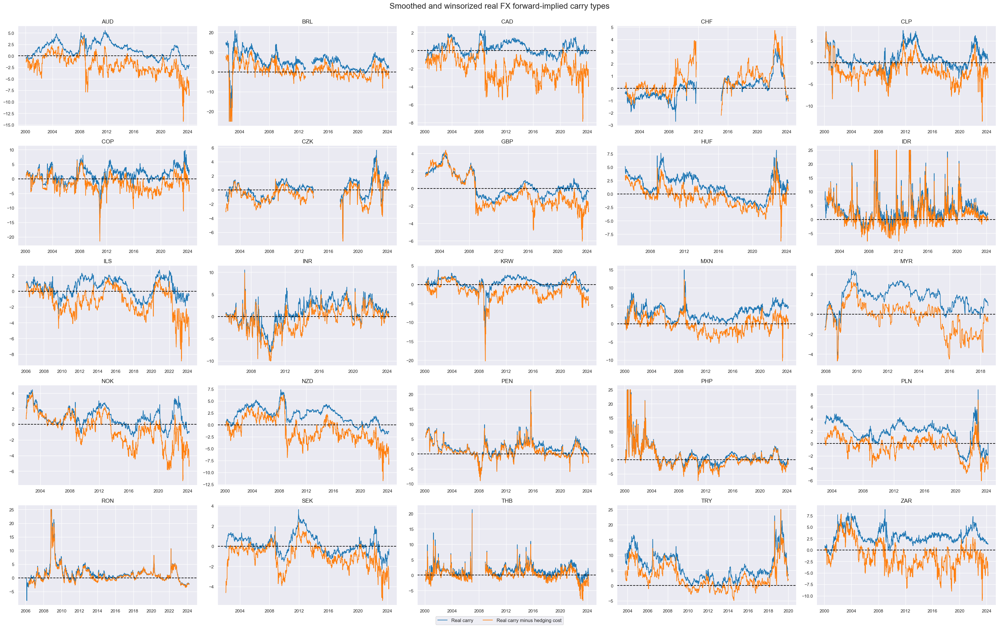

In [14]:
xcatx = [
    "FXCRR_NSA_5DMMW25",
    "FXCRRHvGDRB_NSA_5DMMW25",
]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_ranges(dfx, xcatx, cids=cidx, start=sdate, size=(14, 7))

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=5,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Smoothed and winsorized real FX forward-implied carry types",
    title_fontsize=20,
    xcat_labels = ["Real carry", "Real carry minus hedging cost"],
)

#### PPP overvaluation

##### Overvaluations to USD

The basis for this notebook is PPP exchange rates: JPMaQS provides point-in-time information states of PPP exchange rates that combine annual official PPP exchange rate releases and CPI-based estimates of monthly changes up to the latest month for which CPIs have been released for both the local economy and the United States [(view documentation here)](https://academy.macrosynergy.com/academy/Themes/Financial%20conditions/_build/html/notebooks/PPP%20exchange%20rates.php). Based on these estimated PPP exchange rates, JPMaQS also calculates PPP overvaluation ratios, i.e., ratios of the market-based USD value of the local currency and the PPP value.

We replace overvaluation ratio `PPPFXOVERVALUE_NSA` with percentage change by subtracting 1 and multiplying the difference with 100. 

In [15]:
calcs = ["PPPFXOVERVALUE_NSA_P = 100 * ( PPPFXOVERVALUE_NSA - 1)"]
cidx = cids_fx + ["EUR"]

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

With the help of [`view_ranges()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-distributions-with-view-ranges) and [`view_timelines()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-time-series-with-view-timelines) from the `macrosynergy` package we plot purchasing power parity-based over- or undervaluation versus USD, % of fair value.  

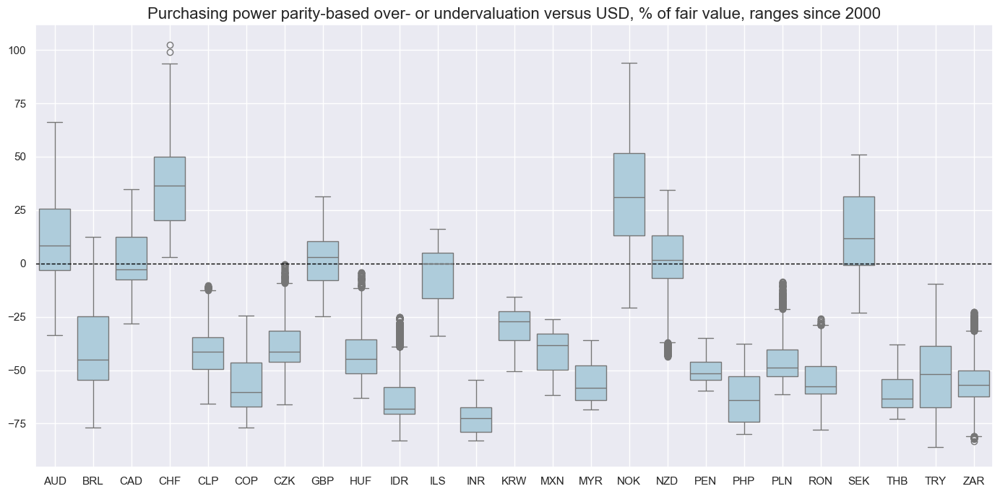

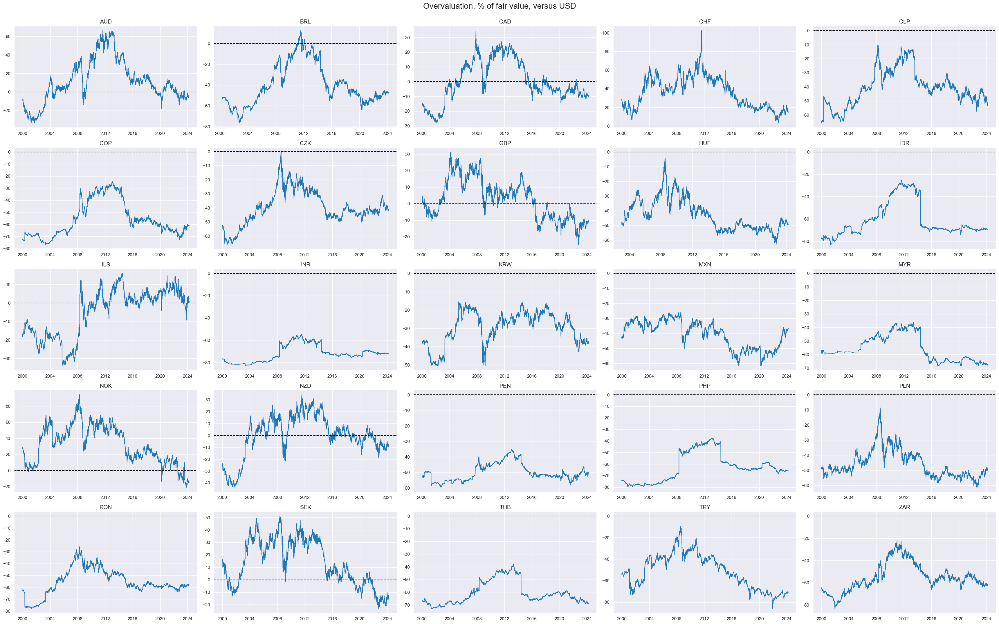

In [16]:
xcatx = ["PPPFXOVERVALUE_NSA_P"]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_ranges(
    dfx,
    xcatx,
    cids=cidx,
    start=sdate,
    title="Purchasing power parity-based over- or undervaluation versus USD, % of fair value, ranges since 2000",
    size=(14, 7),
    kind="box",
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=5,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Overvaluation, % of fair value, versus USD",
    title_fontsize=20,
    )

#### Overvaluation to benchmark

We calculate overvaluation percentages as % of the PPP value against the dominant benchmark currencies rather than the USD alone:

- Currencies traded against EUR:  ["CHF", "CZK", "HUF", "NOK", "PLN", "RON", "SEK"]  
- Currencies traded against USD and EUR: ["GBP", "TRY"]. The benchmark equally weighs USD and EUR data
- Currencies traded against USD: all other currencies in our dataset

Calculation is done with the help of [`panel_calculator()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#create-new-category-panels-with-panel-calculator) function in `macrosynergy.panel`. The resulting overvaluation to the dominant benchmark indicator will get postfix `_vBM`

In [17]:
xcatx = ["PPPFXOVERVALUE_NSA_P"]

for xc in xcatx:
    calc_eur = [f"{xc}vBM = 100 * ( ( 1 + {xc} / 100 ) / ( 1 + iEUR_{xc} / 100 ) - 1 )"]
    calc_usd = [f"{xc}vBM = {xc} "]
    calc_eud = [
        f"{xc}vBM = 0.5 * {xc} + 0.5 * 100 * ( ( 1 + {xc} / 100 ) / ( 1 + iEUR_{xc} / 100 ) - 1 )"
    ]

    dfa_eur = msp.panel_calculator(
        dfx,
        calcs=calc_eur,
        cids=cids_eur,  # blacklist=fxblack
    )
    dfa_usd = msp.panel_calculator(
        dfx,
        calcs=calc_usd,
        cids=cids_usd,  # blacklist=fxblack
    )
    dfa_eud = msp.panel_calculator(
        dfx,
        calcs=calc_eud,
        cids=cids_eud,  # blacklist=fxblack
    )

    dfa = pd.concat([dfa_eur, dfa_usd, dfa_eud])
    dfx = msm.update_df(dfx, dfa)

With the help of [`view_ranges()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-distributions-with-view-ranges) and [`view_timelines()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-time-series-with-view-timelines) from the `macrosynergy` package we plot purchasing power parity-based over- or undervaluation versus USD and vs natural benchmark, % of fair value.  

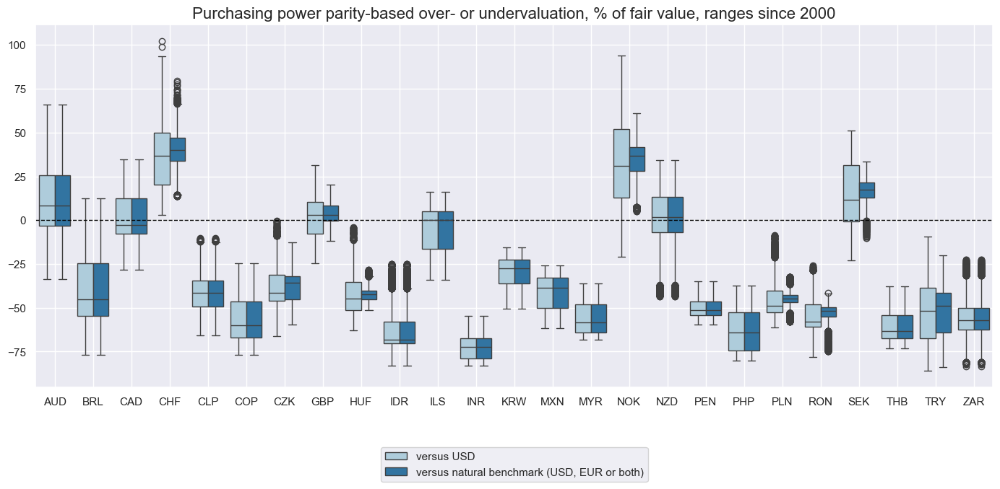

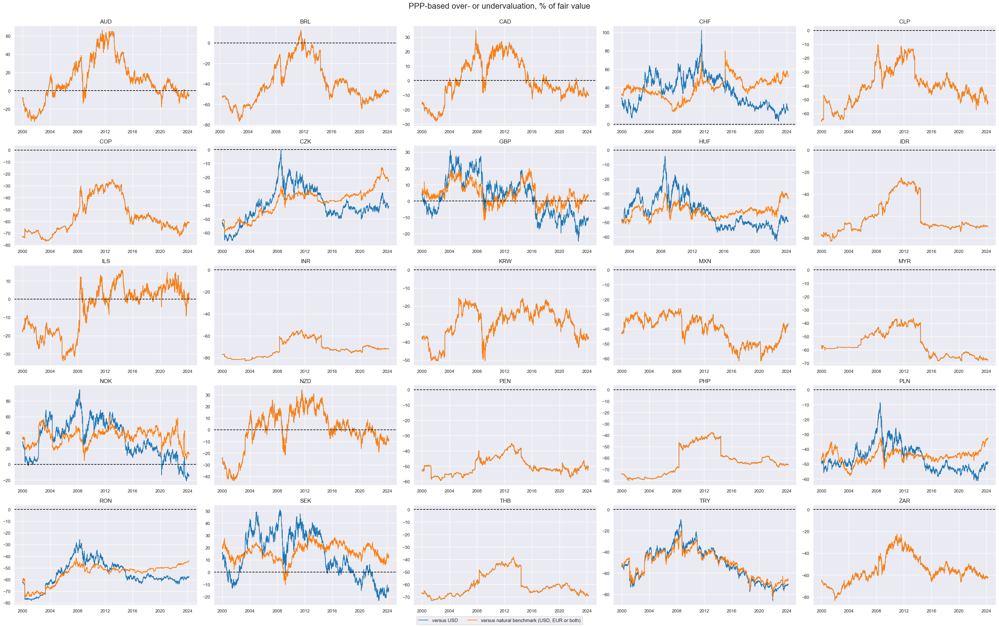

In [18]:
xcatx = ["PPPFXOVERVALUE_NSA_P", "PPPFXOVERVALUE_NSA_PvBM"]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_ranges(
    dfx,
    xcatx,
    cids=cidx,
    start=sdate,
    title="Purchasing power parity-based over- or undervaluation, % of fair value, ranges since 2000",
    xcat_labels=["versus USD", "versus natural benchmark (USD, EUR or both)"],
    size=(14, 7),
    kind="box",
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=5,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="PPP-based over- or undervaluation, % of fair value",
    title_fontsize=20,
    xcat_labels=["versus USD", "versus natural benchmark (USD, EUR or both)"],
    )

To account for structural differences in purchasing power, we adjust overvaluation ratios for long-term median values. In particular, we calculate for each date a median overvaluation percentage since inception (typically early 1990s) up to that date and subtract this median from the concurrent overvaluation metric. We calculate both a full adjustment (`PPPFXOVERVALUE_NSA_PvBMvLTM`) for the median and a partial (50%) adjustment (`PPPFXOVERVALUE_NSA_PvBMvSLTM`) and consider both in subsequent analyses.

In [19]:
xcatx = ["PPPFXOVERVALUE_NSA_P", "PPPFXOVERVALUE_NSA_PvBM"]
calc_1 = [f"{xc}_LTM = {xc}.expanding(min_periods=21*24).median()" for xc in xcatx]
calc_2 = [f"{xc}vLTM = {xc} - {xc}_LTM" for xc in xcatx]
calc_3 = [f"{x}vSLTM = ( {x} + {x}vLTM ) / 2 " for x in xcatx]
calcs = calc_1 + calc_2 + calc_3

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids_fx)
dfx = msm.update_df(dfx, dfa)

The outright overvaluation and the long-term trailing medians are displayed in the panel below using [`view_timelines()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-time-series-with-view-timelines) from the `macrosynergy` package

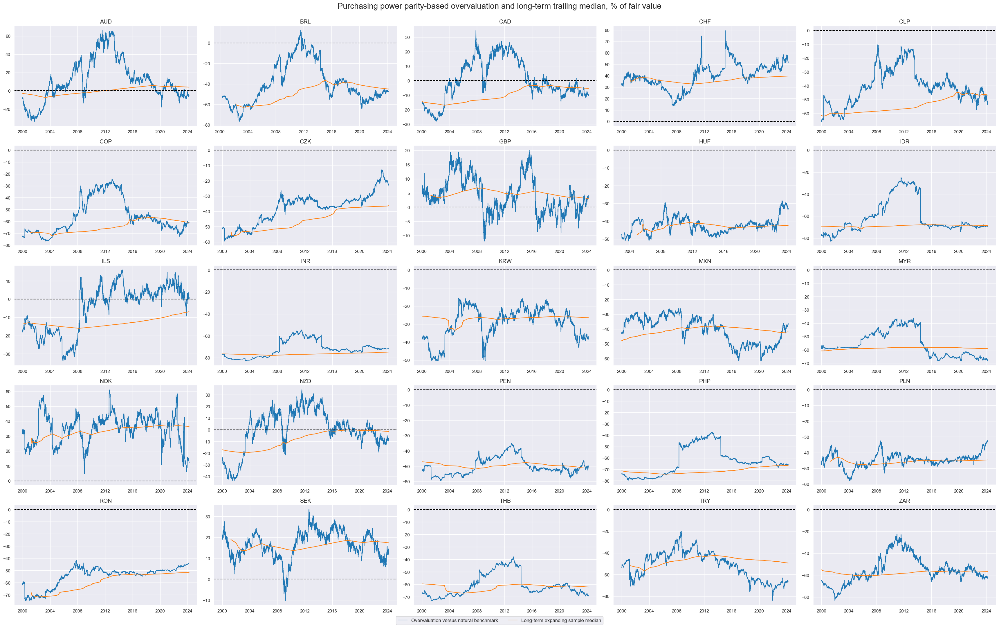

In [20]:
xcatx = ["PPPFXOVERVALUE_NSA_PvBM", "PPPFXOVERVALUE_NSA_PvBM_LTM"]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=5,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Purchasing power parity-based overvaluation and long-term trailing median, % of fair value",
    title_fontsize=20,
    xcat_labels=["Overvaluation versus natural benchmark", "Long-term expanding sample median"],
    )

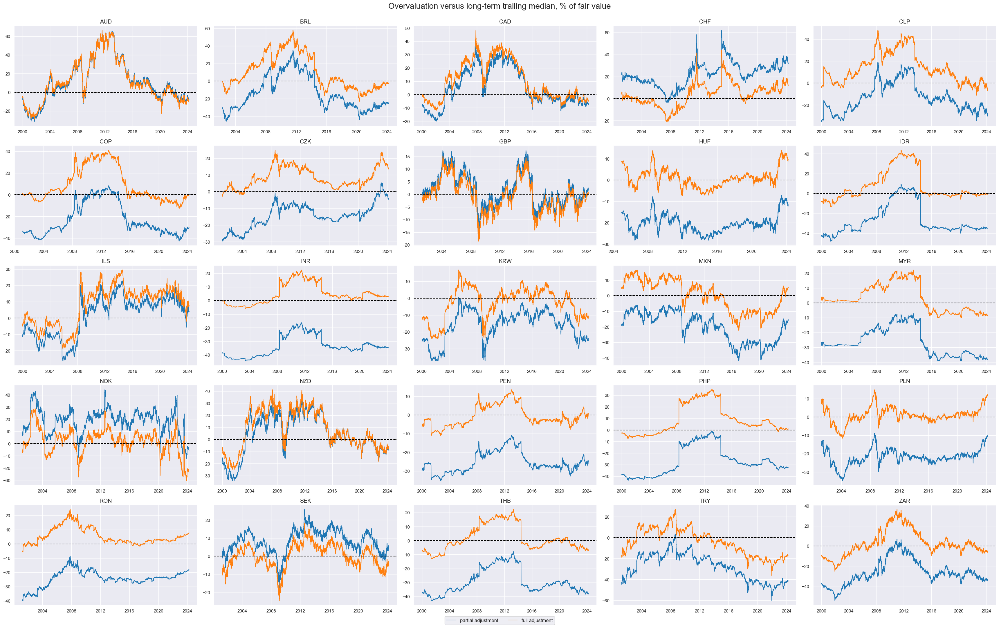

In [21]:
xcatx = ["PPPFXOVERVALUE_NSA_PvBMvSLTM", "PPPFXOVERVALUE_NSA_PvBMvLTM"]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=5,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Overvaluation versus long-term trailing median, % of fair value",
    title_fontsize=20,
    xcat_labels=["partial adjustment", "full adjustment"],
    )

The cell below calculates the negatives for the overvaluation ratios and trends.

In [22]:
ovrts = [  # overvaluation ratios and trends
    "PPPFXOVERVALUE_NSA_PvBMvLTM",
    "PPPFXOVERVALUE_NSA_PvBMvSLTM",
]
xcatx = ovrts

calcs = [f"{xc}N = - {xc} " for xc in xcatx]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids_fx, blacklist=fxblack)
dfx = msm.update_df(dfx, dfa)

#### Carry-overvaluation balance

Based on plausible assumptions that 50% of overvaluation is expected to be correctly linearly over the coming 3-6 years, we subtract either one sixth of one twelfth of the overvaluation from the annualized real carry metrics. The respective carry indicators receive postfixes `_3A` and `_6A`

In [23]:
fcrs = ["FXCRR_NSA_5DMMW25", "FXCRRHvGDRB_NSA_5DMMW25"]
dict_ovs = {  # overvaluation metrics and plausible adjustment times in years
    "PPPFXOVERVALUE_NSA_PvBMvLTM": (3, 6),
    "PPPFXOVERVALUE_NSA_PvBMvSLTM": (3, 6),
}
calcs = []

for cr in fcrs:
    for ov, at in dict_ovs.items():
        croa = "_".join(cr.split("_")[:2] + [ov.split("_")[-1]])
        for i in range(len(at)):
            croa_new = croa + f"_{at[i]}A"
            calcs.append(f"{croa_new} = {cr}  - {ov} / {2 * at[i]}")
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids_fx, blacklist=fxblack)
dfx = msm.update_df(dfx, dfa)

crots = dfa['xcat'].unique().tolist()
crotx = crots + fcrs + [ov + "N" for ov in ovrts]

The resulting adjusted absolute real FX carry timelines are displayed below:

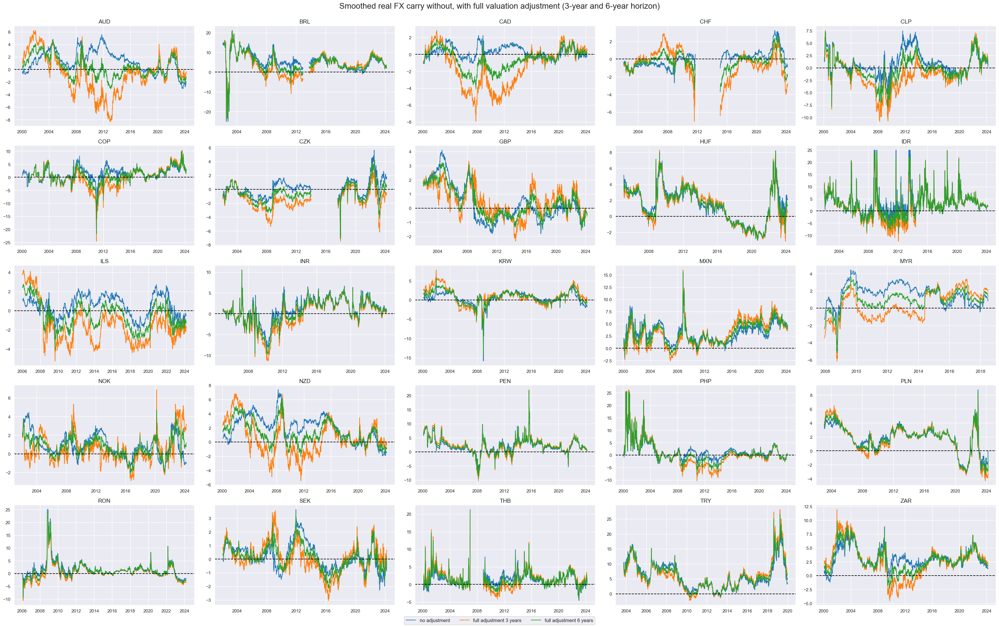

In [24]:
xcatx = [
    "FXCRR_NSA_5DMMW25",
    "FXCRR_NSA_PvBMvLTM_3A",
    "FXCRR_NSA_PvBMvLTM_6A",
]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=5,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Smoothed real FX carry without, with full valuation adjustment (3-year and 6-year horizon)",
    title_fontsize=20,
    xcat_labels=["no adjustment", "full adjustment 3 years", "full adjustment 6 years"],
)

The below facet shows smoothed real FX and the effects of adjustments for a 3-year horizon.

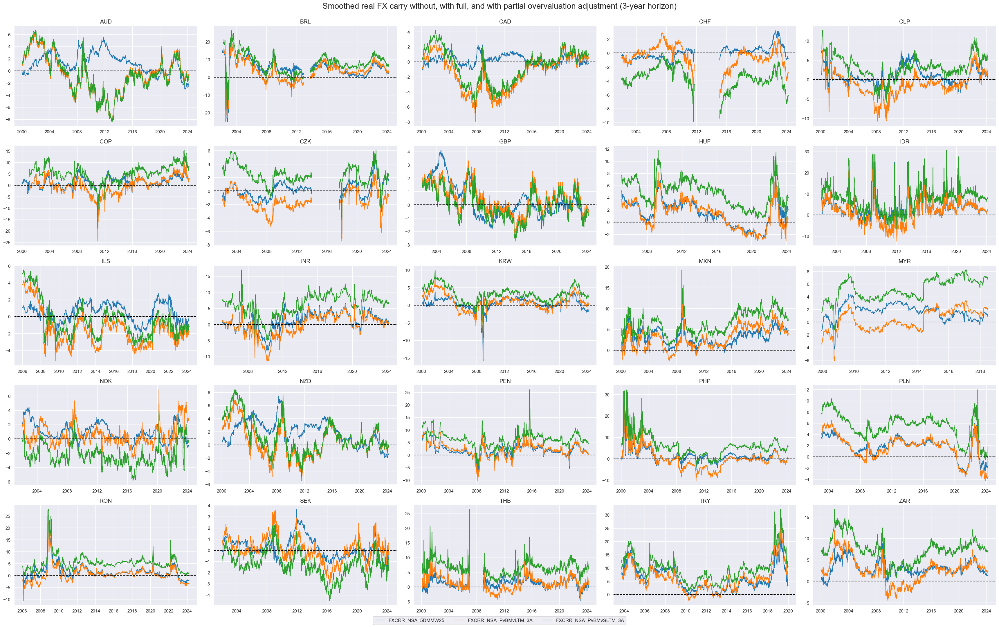

In [25]:
xcatx = [
    "FXCRR_NSA_5DMMW25",
    "FXCRR_NSA_PvBMvLTM_3A",
    "FXCRR_NSA_PvBMvSLTM_3A",
]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=5,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Smoothed real FX carry without, with full, and with partial overvaluation adjustment (3-year horizon)",
    title_fontsize=20,
   )

#### Relative features

The convenience function [`make_relative_value()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#compute-panels-versus-basket-with-make-relative-value) of the `macrosynergy.panel` module calculates values relative for all selected and derived carries and PPPs to an equally-weighted basket while adapting to missing periods of any of the basket cross sections. These relative signals receive postfix `vGFX`. These relative signals will be later used for relative FX strategies.

In [26]:
xcatx = crotx + ovrts
cidx = cids_fx
sdate = "2000-01-01"

dfa = msp.make_relative_value(
    dfx, xcats=xcatx, cids=cidx, start=sdate, blacklist=fxblack, postfix="vGFX"
)
dfx = msm.update_df(dfx, dfa)

The plot below compares absolute and relative adjusted carry side by side:

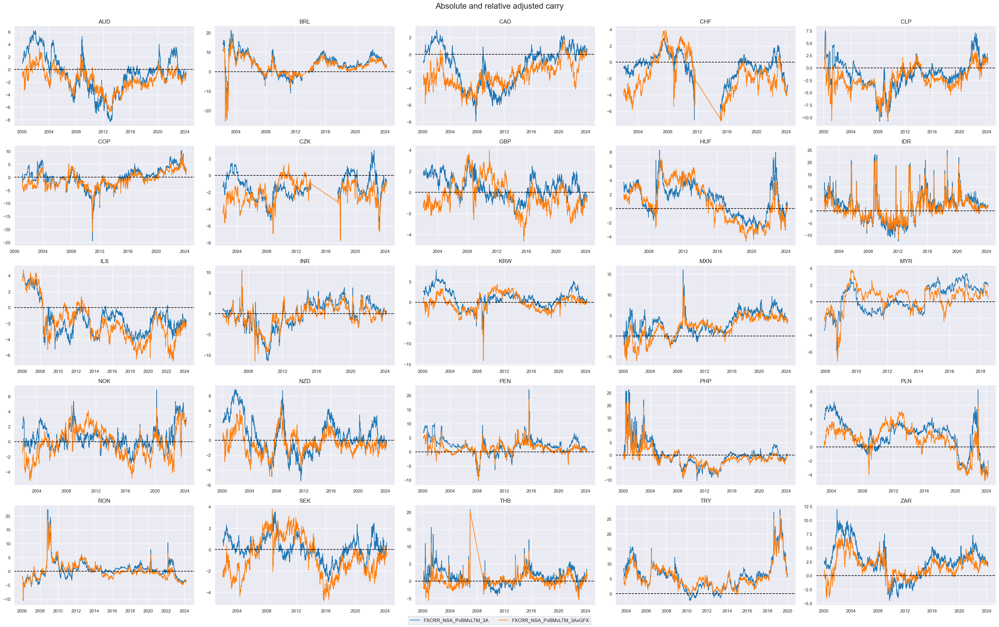

In [27]:
crot = "FXCRR_NSA_PvBMvLTM_3A"
xcatx = [crot, crot + "vGFX"]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=5,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Absolute and relative adjusted carry",
    title_fontsize=20,
)

### Targets

#### Directional

As directional targets we can consider three types of FX returns: outright cumulative FX forward return [`FXXR_NSA`](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/FX%20forward%20returns.php#fx-forward-return-in-of-notional),  volatility targeted (for 10% vol target) dominant cross [`FXXR_VT10`](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/FX%20forward%20returns.php#vol-targeted-fx-forward-return) and cumulative return on FX forward, hedged against market direction risk [`FXXRHvGDRB_NSA`](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/FX%20forward%20returns.php#hedged-fx-forward-return). 

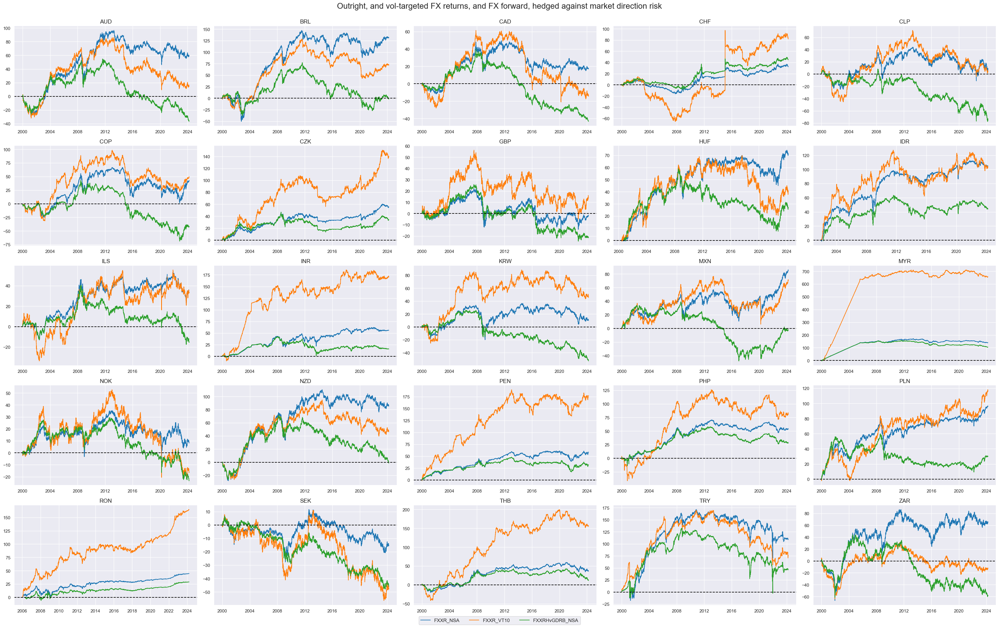

In [28]:
xcatx = ["FXXR_NSA", "FXXR_VT10", "FXXRHvGDRB_NSA"]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids_fx,
    ncol=5,
    cumsum=True,
    start="2000-01-01",
    same_y=False,
    all_xticks=True,
    title="Outright, and vol-targeted FX returns, and FX forward, hedged against market direction risk",
    title_fontsize=20,
   
)

#### Relative targets

The convenience function `make_relative_value()` of the `macrosynergy.panel` module calculates  relative values for the three directional types of FX returns above. These values are calculated relative to an equally-weighted basket while adapting to missing periods of any of the basket cross sections. These relative returns receive postfix `vGFX` (versus Global FX)

In [29]:
xcatx = ["FXXR_NSA", "FXXR_VT10", "FXXRHvGDRB_NSA"]
cidx = cids_fx
sdate = "2000-01-01"

dfa = msp.make_relative_value(
    dfx, xcats=xcatx, cids=cidx, start=sdate, blacklist=fxblack, postfix="vGFX"
)
dfx = msm.update_df(dfx, dfa)

The facet below compares directional (`FXXR_VT10`) with relative (`FXXR_VT10vGFX`) FX returns (both for 10% vol target):

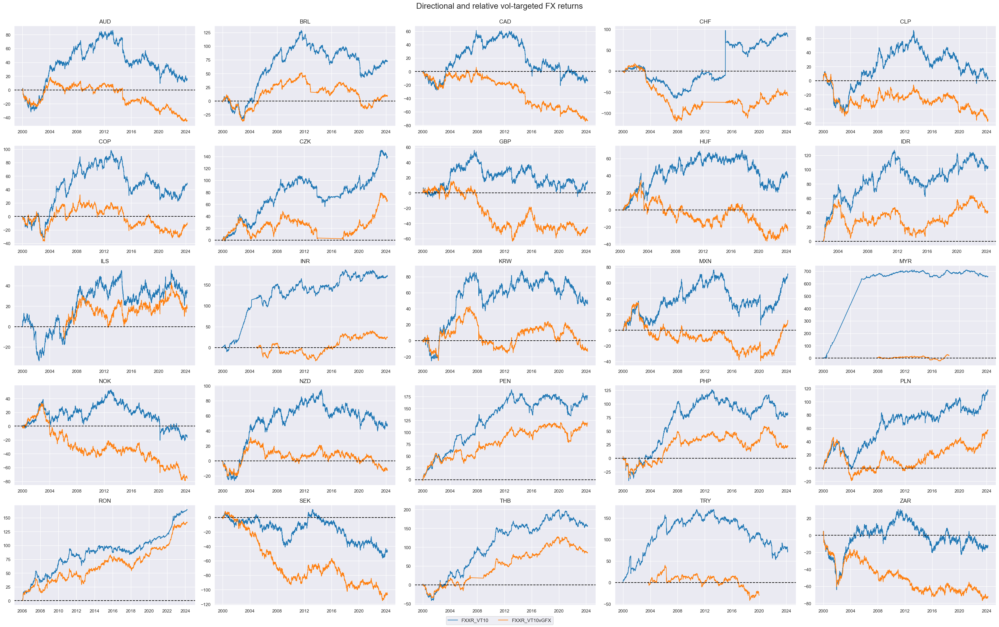

In [30]:
xcatx = ["FXXR_VT10", "FXXR_VT10vGFX"]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids_fx,
    ncol=5,
    cumsum=True,
    start="2000-01-01",
    same_y=False,
    all_xticks=True,
    title="Directional and relative vol-targeted FX returns",
    title_fontsize=20,

)

## Value checks

In this part of the analysis, the notebook calculates the naive PnLs (Profit and Loss) for financial returns (outright and relative FX forward returns in this notebook) using the previously derived FX carry indicators. The PnLs are calculated based on simple trading strategies that utilize the indicators as signals (no regression is involved). The strategies involve going long (buying) or short (selling) on returns based purely on the direction of the score signals.

To evaluate the performance of these strategies, the notebook computes various metrics and ratios, including:

- Correlation: Measures the relationship between indicator changes and consequent financial returns. Positive correlations indicate that the strategy moves in the same direction as the market, while negative correlations indicate an opposite movement.

- Accuracy Metrics: These metrics assess the accuracy of the confidence score-based strategies in predicting market movements. Standard accuracy metrics include accuracy rate, balanced accuracy, precision, etc.

- Performance Ratios: Various performance ratios, such as Sharpe ratio, Sortino ratio, Max draws, etc.

The notebook compares the performance of the simple strategies based on real carry signals with the generic [JPMaQS FX forward returns](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/FX%20forward%20returns.php) and with relative FX forward returns calculated earlier. 

It's important to note that the analysis deliberately disregards transaction costs and risk management considerations. This is done to provide a more straightforward comparison of the strategies' raw performance without the additional complexity introduced by transaction costs and risk management, which can vary based on trading size, institutional rules, and regulations.

In [31]:
# Dictionary for chart labels

dict_labs = {
    "FXCRR_NSA_PvBMvLTM_3A": "Real FX carry, full valuation adjustment over 3 years",
    "FXCRR_NSA_PvBMvSLTM_3A": "Real FX carry, partial valuation adjustment over 3 years",
    "FXCRR_NSA_PvBMvLTM_6A": "Real FX carry, full valuation adjustment over 6 years",
    "FXCRR_NSA_PvBMvSLTM_6A": "Real FX carry, partial valuation adjustment over 6 years",
    "FXCRR_NSA_5DMMW25": "Real FX carry, smoothed and winsorized",
    "PPPFXOVERVALUE_NSA_PvBMvLTMN": "PPP-based overvaluation, partial adjustment",
    "PPPFXOVERVALUE_NSA_PvBMvSLTMN": "PPP-based overvaluation, full adjustment",
}

### Directional adjusted real carry

In this section, we specify signals and the target for the first hypothesis. Here, we test a simple idea that directional real carry can be used as a positive predictor of FX forward returns. Similarly, PPP-based overvaluation metrics have been significant (negative predictors), and hence, real carry metrics that have been adjusted for such overvaluation show a somewhat higher predictive correlation with returns than simple real carry.

#### Specs and panel test

In [32]:
cr_type = "FXCRR_NSA"
feats = [cr for cr in crotx if cr_type in cr] + [ov + "N" for ov in ovrts]

targ = "FXXR_NSA"
cidx = cids_fx
start = "2000-01-01"

dict_crr = {
    "sigs": feats,
     "targ": targ,
    "cidx": cidx,
    "start": start,
    "black": fxblack,
    "srr": None,
    "pnls": None,
}

  [`CategoryRelations()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#investigate-relations-between-panels-with-categoryrelations) function is used for quick visualization and analysis of two categories, in particular, 5-day clipped real FX carry `FXCRR_NSA_5DMMW25` and subsequent [JPMaQS FX forward returns](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/FX%20forward%20returns.php)
. The `.reg_scatter()` method is convenient for visualizing the relationship between two categories, including the strength of the linear association and any potential outliers. It includes a regression line with a 95% confidence interval, which can help assess the significance of the relationship. The analysis is done on quarterly basis.

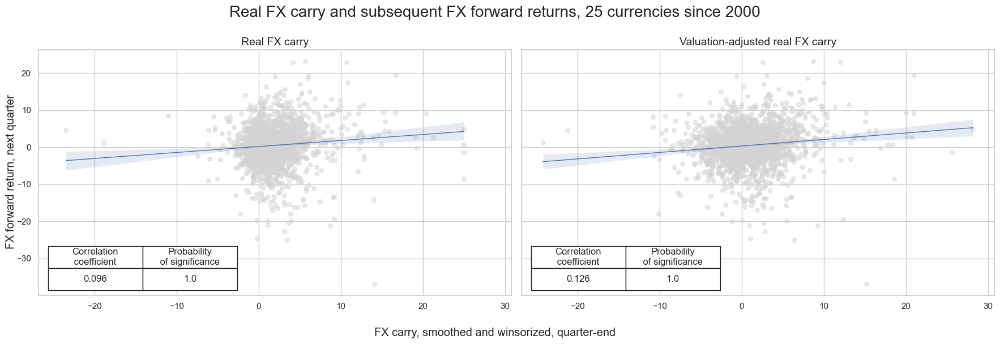

In [73]:
dix = dict_crr

sig = 'FXCRR_NSA_5DMMW25'
targ = dix["targ"]
cidx = dix["cidx"]

crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start="2000-01-01",
    blacklist=fxblack,
    xcat_trims=[None, None],
)

dix = dict_crr

sig = dix["sigs"][0]


crxx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start="2000-01-01",
    blacklist=fxblack,
    xcat_trims=[None, None],
)


msv.multiple_reg_scatter(
        [crx, crxx],
        title="Real FX carry and subsequent FX forward returns, 25 currencies since 2000",
        xlab="FX carry, smoothed and winsorized, quarter-end",
        ylab="FX forward return, next quarter",
        ncol=2,
        nrow=1,
        figsize=(18, 6),
        prob_est="map",
        coef_box="lower left", 
        subplot_titles=["Real FX carry", "Valuation-adjusted real FX carry"],
     )



  We use [`CategoryRelations()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#investigate-relations-between-panels-with-categoryrelations) function for quick visualization and analysis of two categories, in particular, overvaluation adjusted real FX carry, over 3 years `'FXCRR_NSA_PvBMvLTM_3A'` and subsequent [JPMaQS FX forward returns](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/FX%20forward%20returns.php)
. The `.reg_scatter()` method visualizes the relationship between two categories, including the strength of the linear association and any potential outliers. It includes a regression line with a 95% confidence interval, which can help assess the significance of the relationship:

#### Accuracy and correlation check

The [`SignalReturnRelations`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#signalreturnrelations) class from the macrosynergy.signal module is specifically designed to analyze, visualize, and compare the relationships between panels of trading signals and panels of subsequent returns.

In [35]:
dix = dict_crr

sig = dix["sigs"][0]
targ = dix["targ"]
cidx = dix["cidx"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=dix["sigs"],
    sig_neg=[False, False, False, False, False, False, False],
    rets=targ,
    freqs="M",
    start="2000-01-01",
    blacklist=fxblack,
)

dix["srr"] = srr
dix = dict_crr
srrx = dix["srr"]

`multiple_relations_table()` is a method that compares multiple signal-return relations in one table. It is useful to compare the performance of different signals against the same return series (more than one possible financial return) and multiple possible frequencies. The method returns a table with standard columns used for  `single_relation_table()` and other tables, but the rows display different signals from the list of signals specified upon SignalReturnsRelations () `sigs`. The row names indicate the frequency ('D,' 'W,' 'M,' 'Q,' 'A') followed by the signal's and return's names.

In [36]:
display(srrx.multiple_relations_table().round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
M: FXCRR_NSA_5DMMW25/last => FXXR_NSA,0.550,0.533,0.756,0.550,0.566,0.501,0.079,0.000,0.058,0.000,0.525
M: FXCRR_NSA_PvBMvLTM_3A/last => FXXR_NSA,0.532,0.525,0.574,0.550,0.572,0.479,0.090,0.000,0.055,0.000,0.525
M: FXCRR_NSA_PvBMvLTM_6A/last => FXXR_NSA,0.541,0.527,0.658,0.550,0.569,0.486,0.089,0.000,0.060,0.000,0.525
M: FXCRR_NSA_PvBMvSLTM_3A/last => FXXR_NSA,0.552,0.536,0.752,0.550,0.568,0.504,0.084,0.000,0.058,0.000,0.527
M: FXCRR_NSA_PvBMvSLTM_6A/last => FXXR_NSA,0.555,0.540,0.764,0.550,0.569,0.511,0.088,0.000,0.062,0.000,0.529
M: PPPFXOVERVALUE_NSA_PvBMvLTMN/last => FXXR_NSA,0.493,0.506,0.377,0.551,0.558,0.454,0.043,0.001,0.018,0.033,0.506
M: PPPFXOVERVALUE_NSA_PvBMvSLTMN/last => FXXR_NSA,0.542,0.524,0.718,0.551,0.564,0.484,0.053,0.000,0.035,0.000,0.520


#### Naive PnL

[`NaivePnl()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#naivepnl) class is designed to provide a quick and simple overview of a stylized PnL profile of a set of trading signals. The class carries the label naive because its methods do not consider transaction costs or position limitations, such as risk management considerations. This is deliberate because costs and limitations are specific to trading size, institutional rules, and regulations. 

Important options within NaivePnl() function include: 

- `zn_score_pan` option, which transforms raw signals into z-scores around zero value based on the whole panel. The neutral level & standard deviation will use the cross-section of panels. zn-score here means standardized score with zero being the neutral level and standardization through division by mean absolute value. 

- rebalancing frequency (`rebal_freq`) for positions according to signal is chosen monthly,

- rebalancing slippage (`rebal_slip`) in days is 1, which means that it takes one day to rebalance the position and that the new position produces PnL from the second day after the signal has been recorded,

- threshold value (`thresh`) beyond which scores are winsorized, i.e., contained at that threshold. This is often realistic, as risk management and the potential of signal value distortions typically preclude outsized and concentrated positions within a strategy. We apply a threshold of 2.

The function below creates "PZN" PnL: `zn_score_pan` (transforms raw signals into z-scores around zero value based on cross-section alone). We also create long only PnL, labeling it "Long only"

In [37]:
dix = dict_crr

sigx = dix["sigs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    bms=["USD_EQXR_NSA", "EUR_FXXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")
dix["pnls"] = naive_pnl

The [`plot_pnls()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#plot-pnls) method of the `NaivePnl()` class is used to plot a line chart of cumulative PnL 

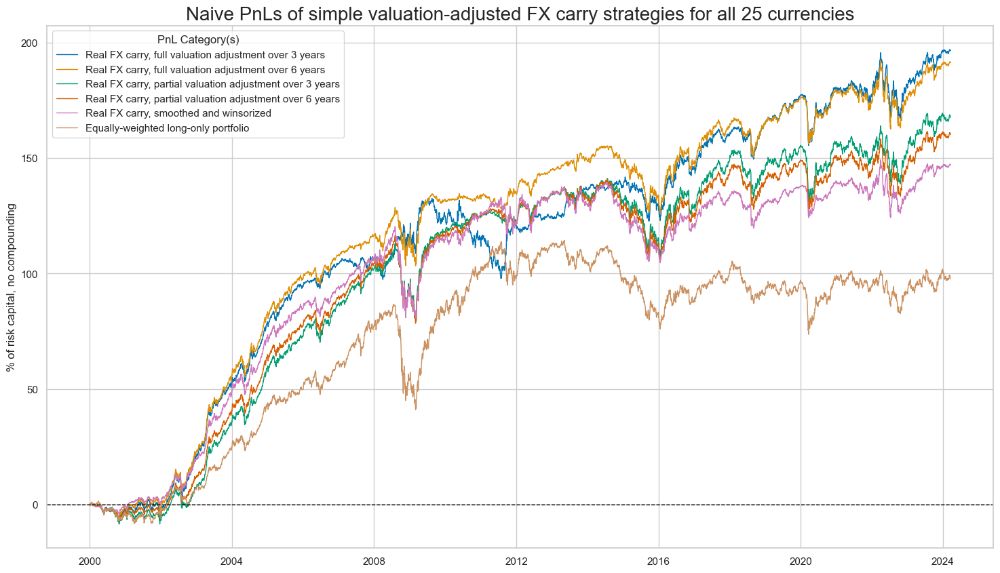

In [38]:
dix = dict_crr

start = dix["start"]
cidx = dix["cidx"]
sigx = dix["sigs"][:-2]

naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx] + ["Long only"]

new_keys = [x + "_PZN" for x in dict_labs.keys()]
dict_labx = {new_key: dict_labs[old_key] for new_key, old_key in zip(new_keys, dict_labs)}
dict_labx["Long only"] = "Equally-weighted long-only portfolio "
labx = [dict_labx[x] for x in pnls]

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive PnLs of simple valuation-adjusted FX carry strategies for all 25 currencies",
    xcat_labels=labx,
    figsize=(18, 10),
)

In [39]:
dix = dict_crr
start = dix["start"]
sigx = dix["sigs"][:-2]

naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
)


The method `evaluate_pnls()` returns a small dataframe of key PnL statistics. For definitions of Sharpe and Sortino ratios, please see [here](https://www.investopedia.com/ask/answers/010815/what-difference-between-sharpe-ratio-and-sortino-ratio.asp#:~:text=The%20Sharpe%20ratio%20indicates%20how,only%20factors%20in%20downside%20risk.) 


In [40]:
display(df_eval.transpose())

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,USD_EQXR_NSA correl,EUR_FXXR_NSA correl,Traded Months
xcat,,,,,,,,,
FXCRR_NSA_5DMMW25_PZN,6.087359,10.214535,0.595951,0.835492,-23.443073,-33.920738,0.323893,0.453781,291
FXCRR_NSA_PvBMvLTM_3A_PZN,8.125383,10.215541,0.795394,1.156281,-20.390094,-26.197391,0.138033,0.079364,291
FXCRR_NSA_PvBMvLTM_6A_PZN,7.914351,10.215331,0.774752,1.109488,-18.902459,-27.009641,0.266786,0.314394,291
FXCRR_NSA_PvBMvSLTM_3A_PZN,6.931061,10.215114,0.67851,0.961398,-20.926892,-27.90481,0.319588,0.384203,291
FXCRR_NSA_PvBMvSLTM_6A_PZN,6.62778,10.214891,0.648835,0.915898,-20.416881,-31.807818,0.330589,0.420539,291


### Relative adjusted real carry

An alternative application of the adjusted carry signal is for trades across small-country currencies. We use relative real FX carry signals and return will be the FX forward position against benchmark currencies, vol-targeted to 10% annualized, against the 25-currency basket of these positions. 

#### Specs and panel test

Here we investigate predictive power of relative adjusted real carry on subsequent relative returns calculated earlier `FXXR_VT10vGFX`

In [41]:
cr_type = "FXCRR_NSA"
feats = [cr + "vGFX" for cr in crotx if cr_type in cr] + [ov + "NvGFX" for ov in ovrts]


targ = "FXXR_VT10vGFX"
cidx = cids_fx
start = "2000-01-01"

dict_crr_vgfx = {
    "sigs": feats,
    "targ": targ,
    "cidx": cidx,
    "start": start,
    "black": fxblack,
    "srr": None,
    "pnls": None,
}

[`CategoryRelations()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#investigate-relations-between-panels-with-categoryrelations) function is used again for quick visualization and analysis of two categories, in particular, Relative real FX carry `'FXCRR_NSA_5DMMW25vGFX'` and subsequent relative FX return `FXXR_VT10vGFX`. The `.reg_scatter()` method is convenient for visualizing the relationship between two categories, including the strength of the linear association and any potential outliers. It includes a regression line with a 95% confidence interval, which can help assess the significance of the relationship. The analysis is done on quarterly basis.

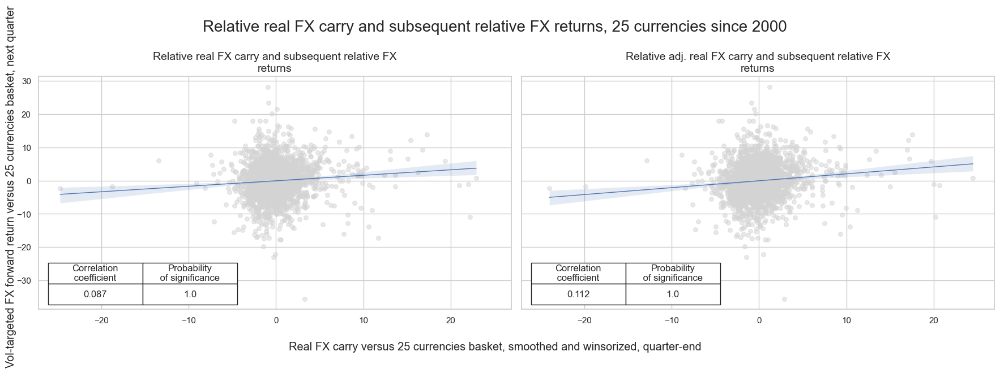

In [74]:
dix = dict_crr_vgfx

sig = 'FXCRR_NSA_5DMMW25vGFX'
targ = dix["targ"]
cidx = dix["cidx"]

crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start="2000-01-01",
    blacklist=fxblack,
    xcat_trims=[None, None],
)

sig = dix["sigs"][1]

crxx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start="2000-01-01",
    blacklist=fxblack,
    xcat_trims=[None, None],
)


msv.multiple_reg_scatter(
        [crx, crxx],
        title="Relative real FX carry and subsequent relative FX returns, 25 currencies since 2000",
        xlab="Real FX carry versus 25 currencies basket, smoothed and winsorized, quarter-end",
        ylab="Vol-targeted FX forward return versus 25 currencies basket, next quarter",
        ncol=2,
        nrow=1,
        figsize=(18, 6),
        prob_est="map",
        coef_box="lower left", 
        subplot_titles=["Relative real FX carry and subsequent relative FX returns", "Relative adj. real FX carry and subsequent relative FX returns"],
     )

#### Accuracy and correlation check

The [`SignalReturnRelations`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#signalreturnrelations) class from the macrosynergy.signal module is specifically designed to analyze, visualize, and compare the relationships between panels of trading signals and panels of subsequent returns.

In [44]:
dix = dict_crr_vgfx

targ = dix["targ"]
cidx = dix["cidx"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=dix["sigs"],
    sig_neg=[False, False, False, False, False, False, False],
    rets=targ,
    freqs="M",
    start="2000-01-01",
    blacklist=fxblack,
)

dix["srr"] = srr
dix = dict_crr_vgfx
srrx = dix["srr"]

In [45]:
display(srrx.multiple_relations_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
M: FXCRR_NSA_5DMMW25vGFX/last => FXXR_VT10vGFX,0.529,0.532,0.425,0.51,0.546,0.517,0.063,0.0,0.058,0.000,0.531
M: FXCRR_NSA_PvBMvLTM_3AvGFX/last => FXXR_VT10vGFX,0.532,0.533,0.462,0.51,0.546,0.521,0.080,0.0,0.063,0.000,0.533
M: FXCRR_NSA_PvBMvLTM_6AvGFX/last => FXXR_VT10vGFX,0.533,0.535,0.440,0.51,0.549,0.521,0.075,0.0,0.065,0.000,0.534
M: FXCRR_NSA_PvBMvSLTM_3AvGFX/last => FXXR_VT10vGFX,0.540,0.539,0.516,0.51,0.548,0.531,0.088,0.0,0.069,0.000,0.539
M: FXCRR_NSA_PvBMvSLTM_6AvGFX/last => FXXR_VT10vGFX,0.541,0.541,0.475,0.51,0.553,0.529,0.084,0.0,0.071,0.000,0.541
M: PPPFXOVERVALUE_NSA_PvBMvLTMNvGFX/last => FXXR_VT10vGFX,0.509,0.509,0.524,0.51,0.518,0.500,0.044,0.0,0.021,0.012,0.509
M: PPPFXOVERVALUE_NSA_PvBMvSLTMNvGFX/last => FXXR_VT10vGFX,0.534,0.533,0.579,0.51,0.537,0.528,0.070,0.0,0.050,0.000,0.532


As in the previous section, we will now evaluate the performance of the valuation-adjusted FX carry strategies. We will use the same naive PnL class as before, but this time we will use the relative FX carries as signals and the relative returns of the vol-targeted FX forward returns as targets.

#### Naive PnL

In [46]:
dix = dict_crr_vgfx

sigx = dix["sigs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    bms=["USD_EQXR_NSA", "EUR_FXXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

dix["pnls"] = naive_pnl

The [`plot_pnls()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#plot-pnls) method of the `NaivePnl()` class is used to plot a line chart of cumulative PnL 

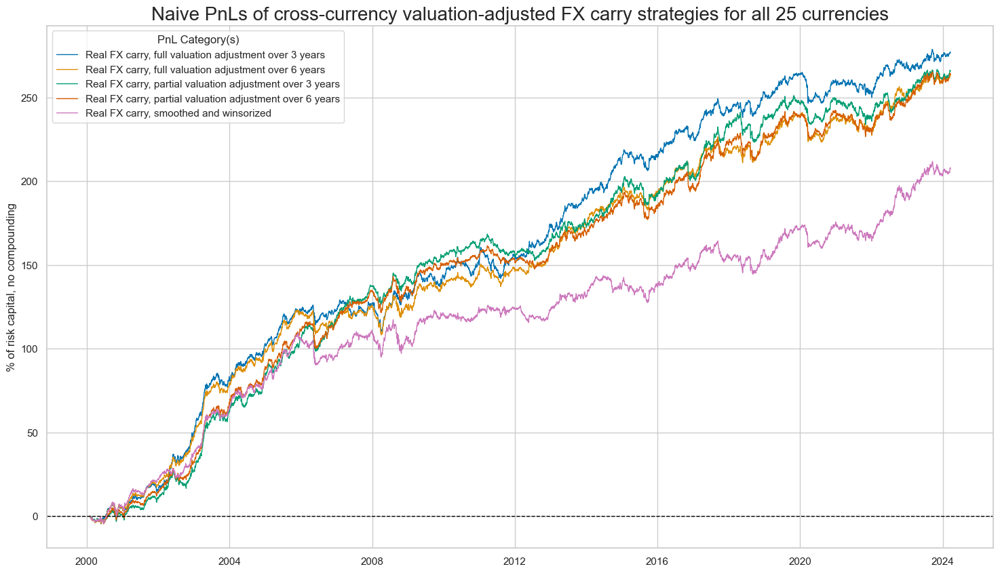

In [47]:
dix = dict_crr_vgfx

start = dix["start"]
cidx = dix["cidx"]
sigx = dix["sigs"][:-2]

naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx]

new_keys = [x + "vGFX_PZN" for x in dict_labs.keys()]
dict_labx = {new_key: dict_labs[old_key] for new_key, old_key in zip(new_keys, dict_labs)}
labx = [dict_labx[x] for x in pnls]

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive PnLs of cross-currency valuation-adjusted FX carry strategies for all 25 currencies",
    xcat_labels=labx,
    figsize=(18, 10),
)

In [48]:
dix = dict_crr_vgfx
start = dix["start"]
sigx = dix["sigs"][:-2]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
)


The method `evaluate_pnls()` returns a small dataframe of key PnL statistics. For definitions of Sharpe and Sortino ratios, please see [here](https://www.investopedia.com/ask/answers/010815/what-difference-between-sharpe-ratio-and-sortino-ratio.asp#:~:text=The%20Sharpe%20ratio%20indicates%20how,only%20factors%20in%20downside%20risk.)

In [49]:
display(df_eval.transpose().astype("float").round(3))

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,USD_EQXR_NSA correl,EUR_FXXR_NSA correl,Traded Months
xcat,,,,,,,,,
FXCRR_NSA_5DMMW25vGFX_PZN,8.629,10.0,0.863,1.235,-14.895,-19.142,0.119,0.031,290.0
FXCRR_NSA_PvBMvLTM_3AvGFX_PZN,11.492,10.0,1.149,1.700,-14.942,-16.552,0.043,-0.094,290.0
FXCRR_NSA_PvBMvLTM_6AvGFX_PZN,10.936,10.0,1.094,1.596,-14.377,-15.766,0.083,-0.039,290.0
FXCRR_NSA_PvBMvSLTM_3AvGFX_PZN,11.027,10.0,1.103,1.610,-13.145,-16.750,0.081,-0.028,290.0
FXCRR_NSA_PvBMvSLTM_6AvGFX_PZN,10.960,10.0,1.096,1.588,-14.622,-15.772,0.104,0.001,290.0


### Directional adjusted hedged carry

A final version of real carry strategy uses the real carry adjusted for hedge costs as signal to set up hedged FX forward positions, i.e., positions in portfolios with an FX forward versus benchmark currencies as the main leg and position in the hedge basket determined by the FX forward’s estimated beta up to the day as the secondary leg.

#### Specs and panel test

In [50]:
cr_type = "FXCRRHvGDRB_NSA"
feats = [cr for cr in crotx if cr_type in cr] + [ov + "N" for ov in ovrts]

targ = "FXXRHvGDRB_NSA"
cidx = cids_fx
start = "2000-01-01"

dict_crh = {
    "sigs": feats,
    "targ": targ,
    "cidx": cidx,
    "start": start,
    "black": fxblack,
    "srr": None,
    "pnls": None,
}

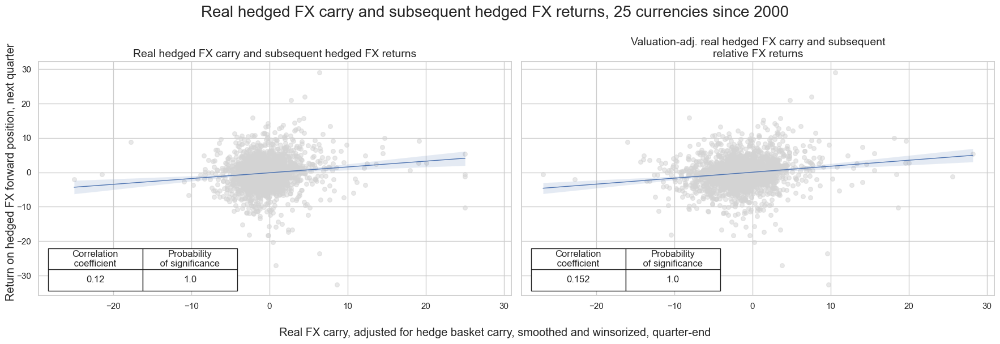

In [75]:
dix = dict_crh

sig = "FXCRRHvGDRB_NSA_5DMMW25"
targ = dix["targ"]
cidx = dix["cidx"]

crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start="2000-01-01",
    blacklist=fxblack,
    xcat_trims=[None, None],
)


sig = dix["sigs"][0]

crxx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start="2000-01-01",
    blacklist=fxblack,
    xcat_trims=[None, None],
)


msv.multiple_reg_scatter(
        [crx, crxx],
        title="Real hedged FX carry and subsequent hedged FX returns, 25 currencies since 2000",
        xlab="Real FX carry, adjusted for hedge basket carry, smoothed and winsorized, quarter-end",
        ylab="Return on hedged FX forward position, next quarter",
        ncol=2,
        nrow=1,
        figsize=(18, 6),
        prob_est="map",
        coef_box="lower left", 
        subplot_titles=["Real hedged FX carry and subsequent hedged FX returns", "Valuation-adj. real hedged FX carry and subsequent relative FX returns"],
     )

#### Accuracy and correlation check

In [53]:
dix = dict_crh


targ = dix["targ"]
cidx = dix["cidx"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=dix["sigs"],
    sig_neg=[False, False, False, False, False, False, False],
    rets=targ,
    freqs="M",
    start="2000-01-01",
    blacklist=fxblack,
)

dix["srr"] = srr

dix = dict_crh
srrx = dix["srr"]

In [54]:
display(srrx.signals_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
FXCRRHvGDRB_NSA_PvBMvLTM_3A,0.542,0.547,0.339,0.500,0.563,0.532,0.108,0.0,0.078,0.0,0.542
FXCRRHvGDRB_NSA_PvBMvLTM_6A,0.545,0.549,0.354,0.500,0.564,0.534,0.106,0.0,0.080,0.0,0.545
FXCRRHvGDRB_NSA_PvBMvSLTM_3A,0.539,0.541,0.617,0.500,0.532,0.551,0.097,0.0,0.068,0.0,0.539
FXCRRHvGDRB_NSA_PvBMvSLTM_6A,0.545,0.545,0.541,0.500,0.542,0.548,0.103,0.0,0.075,0.0,0.545
FXCRRHvGDRB_NSA_5DMMW25,0.544,0.546,0.402,0.500,0.555,0.537,0.093,0.0,0.072,0.0,0.544
PPPFXOVERVALUE_NSA_PvBMvLTMN,0.516,0.517,0.377,0.502,0.523,0.511,0.059,0.0,0.031,0.0,0.516
PPPFXOVERVALUE_NSA_PvBMvSLTMN,0.520,0.524,0.718,0.502,0.515,0.533,0.054,0.0,0.037,0.0,0.520


#### Naive PnL

[`NaivePnl()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#naivepnl) class is used again as for previous strategies:

In [55]:
dix = dict_crh

sigx = dix["sigs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    bms=["USD_EQXR_NSA", "EUR_FXXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")
dix["pnls"] = naive_pnl

The [`plot_pnls()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#plot-pnls) method of the `NaivePnl()` class is used to plot a line chart of cumulative PnL 

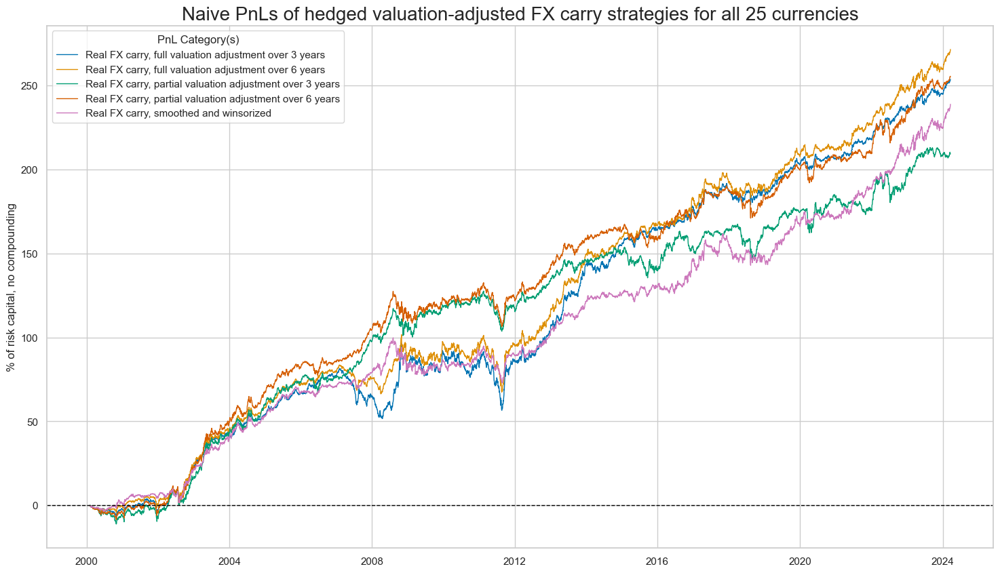

In [56]:
dix = dict_crh

start = dix["start"]
cidx = dix["cidx"]
sigx = dix["sigs"][:-2]

naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx]

new_keys = [x.replace("FXCRR", "FXCRRHvGDRB") + "_PZN" for x in dict_labs.keys()]
dict_labx = {new_key: dict_labs[old_key] for new_key, old_key in zip(new_keys, dict_labs)}
labx = [dict_labx[x] for x in pnls]

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive PnLs of hedged valuation-adjusted FX carry strategies for all 25 currencies",
    xcat_labels=labx,
    figsize=(18, 10),
)

The method `evaluate_pnls()` returns a small dataframe of key PnL statistics. 

In [57]:
dix = dict_crh
start = dix["start"]
sigx = dix["sigs"]

naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
)


In [58]:
display(df_eval.transpose())

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,USD_EQXR_NSA correl,EUR_FXXR_NSA correl,Traded Months
xcat,,,,,,,,,
FXCRRHvGDRB_NSA_5DMMW25_PZN,9.9086,10.0,0.99086,1.450638,-8.836257,-19.748434,0.124179,-0.15412,291
FXCRRHvGDRB_NSA_PvBMvLTM_3A_PZN,10.524134,10.0,1.052413,1.575474,-14.490672,-31.84269,0.080548,-0.254786,291
FXCRRHvGDRB_NSA_PvBMvLTM_6A_PZN,11.26268,10.0,1.126268,1.67125,-13.995002,-30.666347,0.11027,-0.231277,291
FXCRRHvGDRB_NSA_PvBMvSLTM_3A_PZN,8.679557,10.0,0.867956,1.271114,-15.473085,-22.476447,-0.009251,0.102559,291
FXCRRHvGDRB_NSA_PvBMvSLTM_6A_PZN,10.598504,10.0,1.05985,1.562759,-12.120361,-23.786798,0.046853,0.000477,291
PPPFXOVERVALUE_NSA_PvBMvLTMN_PZN,4.055185,10.0,0.405518,0.607836,-13.893107,-31.112676,0.002022,-0.180333,291
PPPFXOVERVALUE_NSA_PvBMvSLTMN_PZN,3.131753,10.0,0.313175,0.446725,-15.751451,-24.535529,-0.089487,0.221649,291


### Relative adjusted hedged carry

Finally, one can apply overvaluation adjustment to hedged cross-currency strategies, i.e., relative positions in the local currency forward versus the dominant benchmark and versus a 25-currency basket of these positions and hedged against global directional market risk. This means we apply hedged relative real carry with respect to hedged relative positions.

In [59]:
cr_type = "FXCRRHvGDRB_NSA"
feats = [cr + "vGFX" for cr in crotx if cr_type in cr] + [ov + "NvGFX" for ov in ovrts]


targ = "FXXRHvGDRB_NSA"
cidx = cids_fx
start = "2000-01-01"

dict_crh_vgfx = {
    "sigs": feats,
    "targ": targ,
    "cidx": cidx,
    "start": start,
    "black": fxblack,
    "srr": None,
    "pnls": None,
}

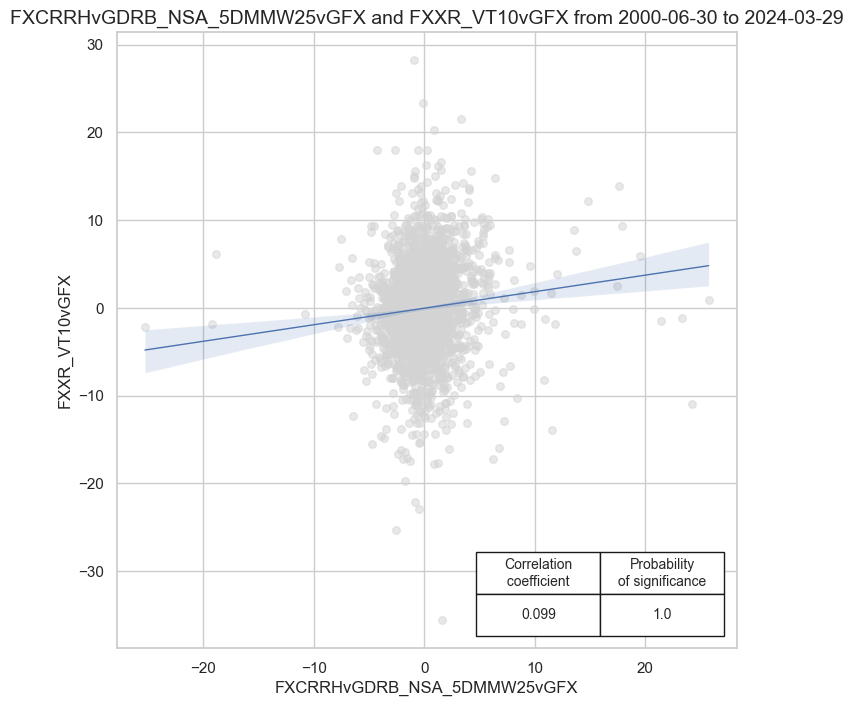

In [60]:
dix = dict_crr_vgfx

sig = 'FXCRRHvGDRB_NSA_5DMMW25vGFX'
targ = dix["targ"]
cidx = dix["cidx"]

crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start="2000-01-01",
    blacklist=fxblack,
    xcat_trims=[None, None],
)
crx.reg_scatter(
    labels=False,
    coef_box="lower right",
    xlab=None,
    ylab=None,
    title=None,
    size=(8, 8),
    prob_est="map"
)

#### Accuracy and correlation check

As before, the [`SignalReturnRelations`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#signalreturnrelations) class from the macrosynergy.signal module is used to analyze, visualize, and compare the relationships between panels of trading signals and panels of subsequent returns.

In [61]:
dix = dict_crh_vgfx

sigs = dix["sigs"]

targ = dix["targ"]
cidx = dix["cidx"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sigs,
   
    sig_neg=[False, False, False, False, False, False, False],
    rets=targ,
    freqs="M",
    start="2000-01-01",
    blacklist=fxblack,
)

dix["srr"] = srr

dix = dict_crh_vgfx
srrx = dix["srr"]

In [62]:
display(srrx.signals_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
FXCRRHvGDRB_NSA_PvBMvLTM_3AvGFX,0.533,0.533,0.498,0.500,0.534,0.532,0.096,0.000,0.065,0.000,0.533
FXCRRHvGDRB_NSA_PvBMvLTM_6AvGFX,0.537,0.537,0.487,0.500,0.539,0.536,0.095,0.000,0.069,0.000,0.537
FXCRRHvGDRB_NSA_PvBMvSLTM_3AvGFX,0.535,0.535,0.505,0.500,0.535,0.535,0.084,0.000,0.057,0.000,0.535
FXCRRHvGDRB_NSA_PvBMvSLTM_6AvGFX,0.538,0.539,0.470,0.500,0.541,0.536,0.091,0.000,0.065,0.000,0.538
FXCRRHvGDRB_NSA_5DMMW25vGFX,0.539,0.539,0.457,0.500,0.542,0.536,0.085,0.000,0.066,0.000,0.539
PPPFXOVERVALUE_NSA_PvBMvLTMNvGFX,0.506,0.506,0.524,0.502,0.508,0.505,0.041,0.001,0.020,0.017,0.506
PPPFXOVERVALUE_NSA_PvBMvSLTMNvGFX,0.524,0.525,0.578,0.502,0.523,0.527,0.041,0.001,0.029,0.000,0.524


#### Naive PnL

[`NaivePnl()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#naivepnl) class is used again as for previous strategies:

In [63]:
dix = dict_crh_vgfx

sigx = dix["sigs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    bms=["USD_EQXR_NSA", "EUR_FXXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

dix["pnls"] = naive_pnl

The [`plot_pnls()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#plot-pnls) method of the `NaivePnl()` class is used to plot a line chart of cumulative PnL 

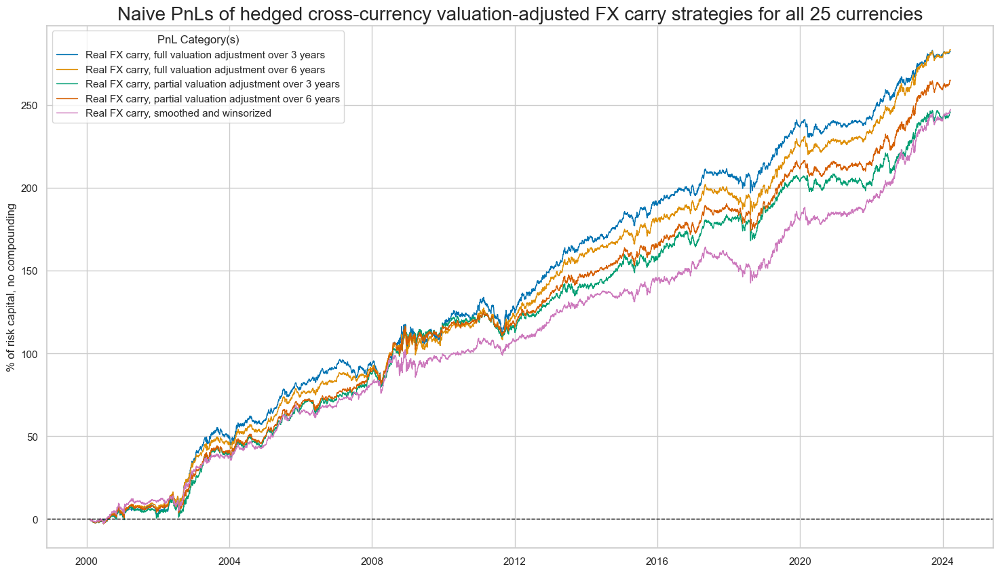

In [64]:
dix = dict_crh_vgfx

start = dix["start"]
cidx = dix["cidx"]
sigx = dix["sigs"][:-2]

naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx]

new_keys = [x.replace("FXCRR", "FXCRRHvGDRB") + "vGFX_PZN" for x in dict_labs.keys()]
dict_labx = {new_key: dict_labs[old_key] for new_key, old_key in zip(new_keys, dict_labs)}
labx = [dict_labx[x] for x in pnls]


naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive PnLs of hedged cross-currency valuation-adjusted FX carry strategies for all 25 currencies",
    xcat_labels=labx,
    figsize=(18, 10),
)

In [65]:
dix = dict_crh_vgfx
start = dix["start"]
sigx = dix["sigs"]

naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
)


The method `evaluate_pnls()` returns a small dataframe of key PnL statistics. For definitions of Sharpe and Sortino ratios, please see [here](https://www.investopedia.com/ask/answers/010815/what-difference-between-sharpe-ratio-and-sortino-ratio.asp#:~:text=The%20Sharpe%20ratio%20indicates%20how,only%20factors%20in%20downside%20risk.) 

In [66]:
display(df_eval.transpose())

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,USD_EQXR_NSA correl,EUR_FXXR_NSA correl,Traded Months
xcat,,,,,,,,,
FXCRRHvGDRB_NSA_5DMMW25vGFX_PZN,10.266121,10.0,1.026612,1.484992,-9.823569,-13.118139,0.079121,-0.224294,291
FXCRRHvGDRB_NSA_PvBMvLTM_3AvGFX_PZN,11.713043,10.0,1.171304,1.735379,-13.35228,-18.795176,0.040282,-0.263329,291
FXCRRHvGDRB_NSA_PvBMvLTM_6AvGFX_PZN,11.768005,10.0,1.176801,1.726156,-11.721537,-16.73646,0.062604,-0.262896,291
FXCRRHvGDRB_NSA_PvBMvSLTM_3AvGFX_PZN,10.195332,10.0,1.019533,1.480535,-11.240518,-13.828742,-0.007025,-0.210042,291
FXCRRHvGDRB_NSA_PvBMvSLTM_6AvGFX_PZN,10.993635,10.0,1.099364,1.593326,-10.489963,-12.88218,0.029383,-0.233039,291
PPPFXOVERVALUE_NSA_PvBMvLTMNvGFX_PZN,3.70094,10.0,0.370094,0.551425,-11.308289,-20.158924,-0.040308,-0.061057,291
PPPFXOVERVALUE_NSA_PvBMvSLTMNvGFX_PZN,5.138919,10.0,0.513892,0.748169,-13.100356,-16.4705,-0.070016,-0.073614,291
